In [1]:
import numpy as np#linear algebra
import pandas as pd#data preprocessing
import seaborn as sns#data visualisation

In [2]:
%matplotlib inline

from matplotlib import pyplot as plt
from matplotlib import style

In [3]:
# Algorithms
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier

# 1)Getting the data

In [4]:

test_df = pd.read_csv('/home/hughjass/KHOLLEZ/Data Mining/titanic/kaggle-titanic-master/input/test.csv')
train_df = pd.read_csv('/home/hughjass/KHOLLEZ/Data Mining/titanic/kaggle-titanic-master/input/train.csv')

train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 12 columns):
PassengerId    891 non-null int64
Survived       891 non-null int64
Pclass         891 non-null int64
Name           891 non-null object
Sex            891 non-null object
Age            714 non-null float64
SibSp          891 non-null int64
Parch          891 non-null int64
Ticket         891 non-null object
Fare           891 non-null float64
Cabin          204 non-null object
Embarked       889 non-null object
dtypes: float64(2), int64(5), object(5)
memory usage: 83.6+ KB


In [5]:
train_df.describe()

,PassengerId,Survived,Pclass,Age,SibSp,Parch,Fare
count,891.000000,891.000000,891.000000,714.000000,891.000000,891.000000,891.000000
mean,446.000000,0.383838,2.308642,29.699118,0.523008,0.381594,32.204208
std,257.353842,0.486592,0.836071,14.526497,1.102743,0.806057,49.693429
min,1.000000,0.000000,1.000000,0.420000,0.000000,0.000000,0.000000
25%,223.500000,0.000000,2.000000,20.125000,0.000000,0.000000,7.910400
50%,446.000000,0.000000,3.000000,28.000000,0.000000,0.000000,14.454200
75%,668.500000,1.000000,3.000000,38.000000,1.000000,0.000000,31.000000
max,891.000000,1.000000,3.000000,80.000000,8.000000,6.000000,512.329200


In [6]:
test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 418 entries, 0 to 417
Data columns (total 11 columns):
PassengerId    418 non-null int64
Pclass         418 non-null int64
Name           418 non-null object
Sex            418 non-null object
Age            332 non-null float64
SibSp          418 non-null int64
Parch          418 non-null int64
Ticket         418 non-null object
Fare           417 non-null float64
Cabin          91 non-null object
Embarked       418 non-null object
dtypes: float64(2), int64(4), object(5)
memory usage: 36.0+ KB


In [7]:
test_df.describe()

,PassengerId,Pclass,Age,SibSp,Parch,Fare
count,418.000000,418.000000,332.000000,418.000000,418.000000,417.000000
mean,1100.500000,2.265550,30.272590,0.447368,0.392344,35.627188
std,120.810458,0.841838,14.181209,0.896760,0.981429,55.907576
min,892.000000,1.000000,0.170000,0.000000,0.000000,0.000000
25%,996.250000,1.000000,21.000000,0.000000,0.000000,7.895800
50%,1100.500000,3.000000,27.000000,0.000000,0.000000,14.454200
75%,1204.750000,3.000000,39.000000,1.000000,0.000000,31.500000
max,1309.000000,3.000000,76.000000,8.000000,9.000000,512.329200


In [8]:
data = [train_df, test_df]
for dataset in data:
    dataset['relatives'] = dataset['SibSp'] + dataset['Parch']
    dataset.loc[dataset['relatives'] > 0, 'alone'] = 0
    dataset.loc[dataset['relatives'] == 0, 'alone'] = 1
    dataset['alone'] = dataset['alone'].astype(int)

In [9]:
train_df['alone'].value_counts()

1    537
0    354
Name: alone, dtype: int64

# 2)Data Preprocessing

In [10]:
#calcualte total null values in training dataset
total = train_df.isnull().sum().sort_values(ascending=False)
percent_1 = train_df.isnull().sum()/train_df.isnull().count()*100
percent_2 = (round(percent_1, 1)).sort_values(ascending=False)
missing_data = pd.concat([total, percent_2], axis=1, keys=['Total', '%'])
missing_data.head()

,Total,%
Cabin,687,77.1
Age,177,19.9
Embarked,2,0.2
alone,0,0.0
relatives,0,0.0


In [11]:
train_df.columns.values

array(['PassengerId', 'Survived', 'Pclass', 'Name', 'Sex', 'Age', 'SibSp',
       'Parch', 'Ticket', 'Fare', 'Cabin', 'Embarked', 'relatives',
       'alone'], dtype=object)

In [12]:
train_df = train_df.drop(['PassengerId'], axis=1)#Irrelevant column

# Handling missing data

In [13]:
import re #regular expression


In [14]:
train_df['Embarked'].describe()


count     889
unique      3
top         S
freq      644
Name: Embarked, dtype: object

In [15]:
most_common = train_df['Embarked'].describe().top
most_common

'S'

In [16]:
deck = {"A": 1, "B": 2, "C": 3, "D": 4, "E": 5, "F": 6, "G": 7, "U": 8}
data = [train_df, test_df]

for dataset in data:
    dataset['Cabin'] = dataset['Cabin'].fillna("U0")
    dataset['Deck'] = dataset['Cabin'].map(lambda x: re.compile("([a-zA-Z]+)").search(x).group())
    dataset['Deck'] = dataset['Deck'].map(deck)
    dataset['Deck'] = dataset['Deck'].fillna(0)
    dataset['Deck'] = dataset['Deck'].astype(int)# we can now drop the cabin feature
    
    mean = dataset['Age'].mean()
    dataset['Age'] = dataset['Age'].fillna(mean)#fill missing age with mean age
    
    dataset['Embarked'] = dataset['Embarked'].fillna(most_common)#fill missing embarked with most common value
    
train_df = train_df.drop(['Cabin'], axis=1)
test_df = test_df.drop(['Cabin'], axis=1)



In [17]:
#re.search() vs re.match() –
#re.match() searches only in the first line of the string and return match object if found, else return none. 
#But if a match of substring is found in some other line other than the first line of string (in case of a multi-line string), it returns none.
#While re.search() searches for the whole string even if the string contains multi-lines and tries to find a match of the substring in all the lines of string.

# 2)Categorising into numeric data

In [18]:
for dataset in data:
    dataset['Fare'] = dataset['Fare'].fillna(0)

In [19]:
#Converting name into numeric title
data = [train_df, test_df]
titles = {"Mr": 1, "Miss": 2, "Mrs": 3, "Master": 4, "Rare": 5}

for dataset in data:
    # extract titles
    dataset['Title'] = dataset.Name.str.extract(' ([A-Za-z]+)\.', expand=False)#if expand is true then one grp will return a dataframe with one column
    # replace titles with a more common title or as Rare                       #else it will return a series
    dataset['Title'] = dataset['Title'].replace(['Lady', 'Countess','Capt', 'Col','Don', 'Dr',\
                                            'Major', 'Rev', 'Sir', 'Jonkheer', 'Dona'], 'Rare')
    dataset['Title'] = dataset['Title'].replace('Mlle', 'Miss')
    dataset['Title'] = dataset['Title'].replace('Ms', 'Miss')
    dataset['Title'] = dataset['Title'].replace('Mme', 'Mrs')
    # convert titles into numbers
    dataset['Title'] = dataset['Title'].map(titles)
    # filling NaN with 0, to get safe
    dataset['Title'] = dataset['Title'].fillna(0)
    
train_df = train_df.drop(['Name'], axis=1)
test_df = test_df.drop(['Name'], axis=1)

In [20]:
train_df.head(20)

,Survived,Pclass,Sex,Age,SibSp,Parch,Ticket,Fare,Embarked,relatives,alone,Deck,Title
0,0,3,male,22.000000,1,0,A/5 21171,7.2500,S,1,0,8,1
1,1,1,female,38.000000,1,0,PC 17599,71.2833,C,1,0,3,3
2,1,3,female,26.000000,0,0,STON/O2. 3101282,7.9250,S,0,1,8,2
3,1,1,female,35.000000,1,0,113803,53.1000,S,1,0,3,3
4,0,3,male,35.000000,0,0,373450,8.0500,S,0,1,8,1
5,0,3,male,29.699118,0,0,330877,8.4583,Q,0,1,8,1
6,0,1,male,54.000000,0,0,17463,51.8625,S,0,1,5,1
7,0,3,male,2.000000,3,1,349909,21.0750,S,4,0,8,4
8,1,3,female,27.000000,0,2,347742,11.1333,S,2,0,8,3
9,1,2,female,14.000000,1,0,237736,30.0708,C,1,0,8,3


In [21]:
genders = {"male": 0, "female": 1}
data = [train_df, test_df]

for dataset in data:
    dataset['Sex'] = dataset['Sex'].map(genders)

In [22]:
train_df.head(20)

,Survived,Pclass,Sex,Age,SibSp,Parch,Ticket,Fare,Embarked,relatives,alone,Deck,Title
0,0,3,0,22.000000,1,0,A/5 21171,7.2500,S,1,0,8,1
1,1,1,1,38.000000,1,0,PC 17599,71.2833,C,1,0,3,3
2,1,3,1,26.000000,0,0,STON/O2. 3101282,7.9250,S,0,1,8,2
3,1,1,1,35.000000,1,0,113803,53.1000,S,1,0,3,3
4,0,3,0,35.000000,0,0,373450,8.0500,S,0,1,8,1
5,0,3,0,29.699118,0,0,330877,8.4583,Q,0,1,8,1
6,0,1,0,54.000000,0,0,17463,51.8625,S,0,1,5,1
7,0,3,0,2.000000,3,1,349909,21.0750,S,4,0,8,4
8,1,3,1,27.000000,0,2,347742,11.1333,S,2,0,8,3
9,1,2,1,14.000000,1,0,237736,30.0708,C,1,0,8,3


In [23]:
train_df['Ticket'].describe()

count          891
unique         681
top       CA. 2343
freq             7
Name: Ticket, dtype: object

In [24]:
#Since Ticket has 681 unique attributes, it's better to drop it
test_df = test_df.drop(['Ticket'],axis = 1)
train_df = train_df.drop(['Ticket'],axis = 1)

In [25]:
ports = {"S": 0, "C": 1, "Q": 2}
data = [train_df, test_df]

for dataset in data:
    dataset['Embarked'] = dataset['Embarked'].map(ports)


In [26]:
train_df.head(20)

,Survived,Pclass,Sex,Age,SibSp,Parch,Fare,Embarked,relatives,alone,Deck,Title
0,0,3,0,22.000000,1,0,7.2500,0,1,0,8,1
1,1,1,1,38.000000,1,0,71.2833,1,1,0,3,3
2,1,3,1,26.000000,0,0,7.9250,0,0,1,8,2
3,1,1,1,35.000000,1,0,53.1000,0,1,0,3,3
4,0,3,0,35.000000,0,0,8.0500,0,0,1,8,1
5,0,3,0,29.699118,0,0,8.4583,2,0,1,8,1
6,0,1,0,54.000000,0,0,51.8625,0,0,1,5,1
7,0,3,0,2.000000,3,1,21.0750,0,4,0,8,4
8,1,3,1,27.000000,0,2,11.1333,0,2,0,8,3
9,1,2,1,14.000000,1,0,30.0708,1,1,0,8,3


In [27]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 12 columns):
Survived     891 non-null int64
Pclass       891 non-null int64
Sex          891 non-null int64
Age          891 non-null float64
SibSp        891 non-null int64
Parch        891 non-null int64
Fare         891 non-null float64
Embarked     891 non-null int64
relatives    891 non-null int64
alone        891 non-null int64
Deck         891 non-null int64
Title        891 non-null int64
dtypes: float64(2), int64(10)
memory usage: 83.6 KB


In [28]:
#Categorising the age attribute

data = [train_df, test_df]
for dataset in data:
    dataset['Age'] = dataset['Age'].astype(int)
    dataset.loc[ dataset['Age'] <= 10, 'Age'] = 0
    dataset.loc[(dataset['Age'] > 10) & (dataset['Age'] <= 20), 'Age'] = 1
    dataset.loc[(dataset['Age'] > 20) & (dataset['Age'] <= 30), 'Age'] = 2
    dataset.loc[(dataset['Age'] > 30) & (dataset['Age'] <= 40), 'Age'] = 3
    dataset.loc[(dataset['Age'] > 40) & (dataset['Age'] <= 50), 'Age'] = 4
    dataset.loc[(dataset['Age'] > 50) & (dataset['Age'] <= 60), 'Age'] = 5
    dataset.loc[(dataset['Age'] > 60) & (dataset['Age'] <= 70), 'Age'] = 6
    dataset.loc[ dataset['Age'] > 70, 'Age'] = 7

# let's see how it's distributed 

In [29]:
train_df['Age'].value_counts()

2    408
3    155
1    116
4     84
0     64
5     42
6     18
7      4
Name: Age, dtype: int64

In [30]:
train_df.head(20)

,Survived,Pclass,Sex,Age,SibSp,Parch,Fare,Embarked,relatives,alone,Deck,Title
0,0,3,0,2,1,0,7.2500,0,1,0,8,1
1,1,1,1,3,1,0,71.2833,1,1,0,3,3
2,1,3,1,2,0,0,7.9250,0,0,1,8,2
3,1,1,1,3,1,0,53.1000,0,1,0,3,3
4,0,3,0,3,0,0,8.0500,0,0,1,8,1
5,0,3,0,2,0,0,8.4583,2,0,1,8,1
6,0,1,0,5,0,0,51.8625,0,0,1,5,1
7,0,3,0,0,3,1,21.0750,0,4,0,8,4
8,1,3,1,2,0,2,11.1333,0,2,0,8,3
9,1,2,1,1,1,0,30.0708,1,1,0,8,3


In [31]:
#Categorising the Fare attribute
data = [train_df, test_df]

for dataset in data:
    dataset.loc[ dataset['Fare'] <= 7.91, 'Fare'] = 0
    dataset.loc[(dataset['Fare'] > 7.91) & (dataset['Fare'] <= 14.454), 'Fare'] = 1
    dataset.loc[(dataset['Fare'] > 14.454) & (dataset['Fare'] <= 31), 'Fare']   = 2
    dataset.loc[(dataset['Fare'] > 31) & (dataset['Fare'] <= 99), 'Fare']   = 3
    dataset.loc[(dataset['Fare'] > 99) & (dataset['Fare'] <= 250), 'Fare']   = 4
    dataset.loc[ dataset['Fare'] > 250, 'Fare'] = 5
    

In [32]:
train_df.head(20)

,Survived,Pclass,Sex,Age,SibSp,Parch,Fare,Embarked,relatives,alone,Deck,Title
0,0,3,0,2,1,0,0.0,0,1,0,8,1
1,1,1,1,3,1,0,3.0,1,1,0,3,3
2,1,3,1,2,0,0,1.0,0,0,1,8,2
3,1,1,1,3,1,0,3.0,0,1,0,3,3
4,0,3,0,3,0,0,1.0,0,0,1,8,1
5,0,3,0,2,0,0,1.0,2,0,1,8,1
6,0,1,0,5,0,0,3.0,0,0,1,5,1
7,0,3,0,0,3,1,2.0,0,4,0,8,4
8,1,3,1,2,0,2,1.0,0,2,0,8,3
9,1,2,1,1,1,0,2.0,1,1,0,8,3


# 3)Feature Engineering

In [33]:
data = [train_df, test_df]
for dataset in data:
    dataset['Age_Class']= dataset['Age']* dataset['Pclass']

In [34]:
train_df.head(20)

,Survived,Pclass,Sex,Age,SibSp,Parch,Fare,Embarked,relatives,alone,Deck,Title,Age_Class
0,0,3,0,2,1,0,0.0,0,1,0,8,1,6
1,1,1,1,3,1,0,3.0,1,1,0,3,3,3
2,1,3,1,2,0,0,1.0,0,0,1,8,2,6
3,1,1,1,3,1,0,3.0,0,1,0,3,3,3
4,0,3,0,3,0,0,1.0,0,0,1,8,1,9
5,0,3,0,2,0,0,1.0,2,0,1,8,1,6
6,0,1,0,5,0,0,3.0,0,0,1,5,1,5
7,0,3,0,0,3,1,2.0,0,4,0,8,4,0
8,1,3,1,2,0,2,1.0,0,2,0,8,3,6
9,1,2,1,1,1,0,2.0,1,1,0,8,3,2


In [35]:
data = [train_df, test_df]
for dataset in data:
    dataset['Fare'] = dataset['Fare'].fillna(0)
    dataset['Fare_Per_Person'] = dataset['Fare']/(dataset['relatives']+1)
    dataset['Fare_Per_Person'] = dataset['Fare_Per_Person'].astype(int)

# 4)Building Models

In [36]:
X_train = train_df.drop("Survived", axis=1)
Y_train = train_df["Survived"]
X_test  = test_df.drop("PassengerId", axis=1).copy()

In [37]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 14 columns):
Survived           891 non-null int64
Pclass             891 non-null int64
Sex                891 non-null int64
Age                891 non-null int64
SibSp              891 non-null int64
Parch              891 non-null int64
Fare               891 non-null float64
Embarked           891 non-null int64
relatives          891 non-null int64
alone              891 non-null int64
Deck               891 non-null int64
Title              891 non-null int64
Age_Class          891 non-null int64
Fare_Per_Person    891 non-null int64
dtypes: float64(1), int64(13)
memory usage: 97.5 KB


In [38]:
test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 418 entries, 0 to 417
Data columns (total 14 columns):
PassengerId        418 non-null int64
Pclass             418 non-null int64
Sex                418 non-null int64
Age                418 non-null int64
SibSp              418 non-null int64
Parch              418 non-null int64
Fare               418 non-null float64
Embarked           418 non-null int64
relatives          418 non-null int64
alone              418 non-null int64
Deck               418 non-null int64
Title              418 non-null int64
Age_Class          418 non-null int64
Fare_Per_Person    418 non-null int64
dtypes: float64(1), int64(13)
memory usage: 45.8 KB


In [39]:
X_train.head(20)

,Pclass,Sex,Age,SibSp,Parch,Fare,Embarked,relatives,alone,Deck,Title,Age_Class,Fare_Per_Person
0,3,0,2,1,0,0.0,0,1,0,8,1,6,0
1,1,1,3,1,0,3.0,1,1,0,3,3,3,1
2,3,1,2,0,0,1.0,0,0,1,8,2,6,1
3,1,1,3,1,0,3.0,0,1,0,3,3,3,1
4,3,0,3,0,0,1.0,0,0,1,8,1,9,1
5,3,0,2,0,0,1.0,2,0,1,8,1,6,1
6,1,0,5,0,0,3.0,0,0,1,5,1,5,3
7,3,0,0,3,1,2.0,0,4,0,8,4,0,0
8,3,1,2,0,2,1.0,0,2,0,8,3,6,0
9,2,1,1,1,0,2.0,1,1,0,8,3,2,1


In [40]:
Y_train.head(20)

0     0
1     1
2     1
3     1
4     0
5     0
6     0
7     0
8     1
9     1
10    1
11    1
12    0
13    0
14    0
15    1
16    0
17    1
18    0
19    1
Name: Survived, dtype: int64

In [41]:
X_test.head(20)

,Pclass,Sex,Age,SibSp,Parch,Fare,Embarked,relatives,alone,Deck,Title,Age_Class,Fare_Per_Person
0,3,0,3,0,0,0.0,2,0,1,8,1,9,0
1,3,1,4,1,0,0.0,0,1,0,8,3,12,0
2,2,0,6,0,0,1.0,2,0,1,8,1,12,1
3,3,0,2,0,0,1.0,0,0,1,8,1,6,1
4,3,1,2,1,1,1.0,0,2,0,8,3,6,0
5,3,0,1,0,0,1.0,0,0,1,8,1,3,1
6,3,1,2,0,0,0.0,2,0,1,8,2,6,0
7,2,0,2,1,1,2.0,0,2,0,8,1,4,0
8,3,1,1,0,0,0.0,1,0,1,8,3,3,0
9,3,0,2,2,0,2.0,0,2,0,8,1,6,0


In [42]:
#1) Random Forest Classifier
random_forest = RandomForestClassifier(n_estimators=100) #100 = no. of decision trees to be used
random_forest.fit(X_train, Y_train)

Y_prediction = random_forest.predict(X_test)

random_forest.score(X_train, Y_train)
acc_random_forest = round(random_forest.score(X_train, Y_train) * 100, 4)

In [43]:
#2) Logistic Regression
logreg = LogisticRegression()
logreg.fit(X_train, Y_train)

Y_pred = logreg.predict(X_test)

acc_log = round(logreg.score(X_train, Y_train) * 100, 4)

/home/hughjass/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


In [44]:
#3) KNN
knn = KNeighborsClassifier(n_neighbors = 3)#first 3 neighbours
knn.fit(X_train, Y_train)

Y_pred = knn.predict(X_test)

acc_knn = round(knn.score(X_train, Y_train) * 100, 4)

In [45]:
#4) Decision Tree

decision_tree = DecisionTreeClassifier()
decision_tree.fit(X_train, Y_train)
Y_pred = decision_tree.predict(X_test)
acc_decision_tree = round(decision_tree.score(X_train, Y_train) * 100, 4)

In [46]:
results = pd.DataFrame({'Model':['RFC','Logistic Regn','KNN','Decision Tree'],'Score':[acc_random_forest,acc_log,acc_knn,acc_decision_tree]})
results_df = results.sort_values(by = 'Score',ascending = False).set_index('Model')
#results_df = results_df.set_index('Score')
results_df.head()

,Score
Model,
RFC,92.0314
Decision Tree,92.0314
KNN,84.9607
Logistic Regn,81.7059


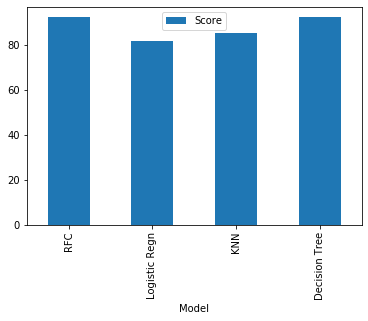

In [47]:
r = results.plot.bar(x='Model', y='Score', rot=90)

# 5)Confusion Matrix

In [48]:
from sklearn.model_selection import cross_val_predict
from sklearn.metrics import confusion_matrix

predictions = cross_val_predict(random_forest, X_train, Y_train, cv=3)
cm = confusion_matrix(Y_train, predictions)
cm

array([[474,  75],
       [ 96, 246]])

In [49]:
tp = cm[0][0]
fp = cm[0][1]
fn = cm[1][0]
tn = cm[1][1]


In [50]:
acc = (tp + tn)/(tp+tn+fp+fn)
recall = tp/(tp+fn)
precision = tp/(tp+fp)
f1 = 2*recall*precision/(recall+precision)

In [51]:
rep = {'Accuracy':acc,'Recall':recall,'Precision':precision,'F1 Score':f1}
report = pd.DataFrame(rep, index = [1])
report.transpose()

,1
Accuracy,0.808081
Recall,0.831579
Precision,0.863388
F1 Score,0.847185


In [52]:
from sklearn.tree import export_graphviz
estimator = random_forest.estimators_[5]

In [53]:
export_graphviz(estimator, 
                out_file='tree.dot', 
                feature_names = X_train.columns.values,
                class_names = ["0","1"],
                rounded = True, proportion = False, 
                precision = 2, filled = True)

In [54]:
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

0

In [55]:
from IPython.display import Image
Image(filename = 'tree.png', height = 2000, width = 2000)

# 6) Cross Validation 

In [56]:
#Use K-Fold Cross Validation on Random Forest Classifier

In [57]:
from sklearn.model_selection import cross_val_score
rf = RandomForestClassifier(n_estimators=100)
scores = cross_val_score(rf, X_train, Y_train, cv=10, scoring = "accuracy")

In [58]:
#Printing array of accuracies of Random Forest Classifier
for x in scores:
    print(x*100,'%')


75.55555555555556 %
84.44444444444444 %
75.28089887640449 %
87.64044943820225 %
86.51685393258427 %
83.14606741573034 %
82.02247191011236 %
77.52808988764045 %
85.39325842696628 %
85.22727272727273 %


In [59]:
#Mean accuracy of Random Forest Classifier
x = scores.mean()
print(x*100,'%')

82.27553626149134 %


# 7)Enhancing Accuracy

In [60]:
#Feature Importance - Removing columns which are least important

In [61]:
importances = pd.DataFrame({'feature':X_train.columns,'importance':np.round(random_forest.feature_importances_,3)})
importances = importances.sort_values('importance',ascending=False).set_index('feature')

In [62]:
importances.head(15)

,importance
feature,
Title,0.204
Sex,0.176
Age_Class,0.092
Deck,0.083
Pclass,0.078
Fare,0.069
Age,0.062
relatives,0.061
Embarked,0.058


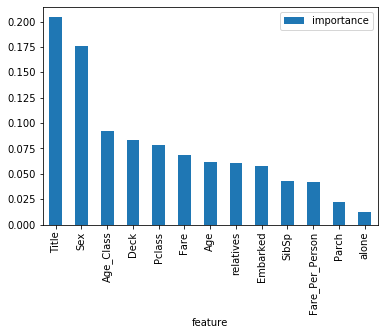

In [63]:
importances.plot.bar()

In [64]:
#Dropping the last 2 columns which are not important
train_df  = train_df.drop("alone", axis=1)
test_df  = test_df.drop("alone", axis=1)

train_df  = train_df.drop("Parch", axis=1)
test_df  = test_df.drop("Parch", axis=1)




In [65]:
X_train = X_train.drop(["alone","Parch"],axis=1)
X_test = X_test.drop(["alone","Parch"],axis=1)

In [66]:
X_train.head(20)


,Pclass,Sex,Age,SibSp,Fare,Embarked,relatives,Deck,Title,Age_Class,Fare_Per_Person
0,3,0,2,1,0.0,0,1,8,1,6,0
1,1,1,3,1,3.0,1,1,3,3,3,1
2,3,1,2,0,1.0,0,0,8,2,6,1
3,1,1,3,1,3.0,0,1,3,3,3,1
4,3,0,3,0,1.0,0,0,8,1,9,1
5,3,0,2,0,1.0,2,0,8,1,6,1
6,1,0,5,0,3.0,0,0,5,1,5,3
7,3,0,0,3,2.0,0,4,8,4,0,0
8,3,1,2,0,1.0,0,2,8,3,6,0
9,2,1,1,1,2.0,1,1,8,3,2,1


In [67]:
Y_train.head(20)

0     0
1     1
2     1
3     1
4     0
5     0
6     0
7     0
8     1
9     1
10    1
11    1
12    0
13    0
14    0
15    1
16    0
17    1
18    0
19    1
Name: Survived, dtype: int64

In [68]:
X_test.head(20)

,Pclass,Sex,Age,SibSp,Fare,Embarked,relatives,Deck,Title,Age_Class,Fare_Per_Person
0,3,0,3,0,0.0,2,0,8,1,9,0
1,3,1,4,1,0.0,0,1,8,3,12,0
2,2,0,6,0,1.0,2,0,8,1,12,1
3,3,0,2,0,1.0,0,0,8,1,6,1
4,3,1,2,1,1.0,0,2,8,3,6,0
5,3,0,1,0,1.0,0,0,8,1,3,1
6,3,1,2,0,0.0,2,0,8,2,6,0
7,2,0,2,1,2.0,0,2,8,1,4,0
8,3,1,1,0,0.0,1,0,8,3,3,0
9,3,0,2,2,2.0,0,2,8,1,6,0


In [69]:
#Trying the Random Forest Algorithm again

In [70]:
# Random Forest

random_forest2 = RandomForestClassifier(n_estimators=100)

random_forest2.fit(X_train, Y_train)
Y_prediction = random_forest2.predict(X_test)

random_forest2.score(X_train, Y_train)

acc_random_forest2 = round(random_forest2.score(X_train, Y_train) * 100, 4)


In [71]:
print(round(acc_random_forest2,4,), "%")

92.0314 %
